<a href="https://colab.research.google.com/github/deepaktho/190020037_WEB_DEV/blob/master/Vanilla_DCGAN_original_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Loading Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torch.utils.data as data
from torch.utils.data import DataLoader
from torch.nn.parallel import DistributedDataParallel as DDP
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import sampler
import torchvision.datasets as dset
from torch.autograd import Variable

import os
import time
from google.colab.patches import cv2_imshow
import pickle
import cv2
import numpy as np
import glob
from PIL import Image
import shutil

from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from torchsummary import summary

from itertools import product
from math import sqrt

dtype = torch.cuda.FloatTensor
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if torch.cuda.is_available()==False:
  dtype=torch.FloatTensor
print(device,dtype)

cuda <class 'torch.cuda.FloatTensor'>


Setting configuration

In [ ]:
class set_config:

  def __init__(self):
    self.cuda=torch.cuda.is_available()
    self.weight_decay=0 #set
    self.lr=4e-5 #set
    self.test_img_name=None #set
    self.batch_size=30 #set
    self.mode='train'
    self.resume=True
    try:
      self.save_path=glob.glob('/content/drive/MyDrive/CS726_proj/weights/*')[0]
    except:
      self.save_path=glob.glob('/content/drive/MyDrive/CS726_proj/weights/*')
    self.dir='/content/drive/MyDrive/CS726_proj/'
    self.lamb=100
    self.epoch = 10

config=set_config()
print(config.save_path)

/content/drive/MyDrive/CS726_proj/weights/latest_colorize_weights_9.pth.tar


Generator Model

In [ ]:
class Generator(nn.Module):

    def __init__(self):
      super(Generator,self).__init__()
      self.conv1=nn.Conv2d(1,64,3,stride=1,padding=1,bias=False)
      self.relu1=nn.LeakyReLU(0.2)

      self.conv2=nn.Conv2d(64,64,3,stride=2,padding=1,bias=False)
      self.bn2=nn.BatchNorm2d(64,momentum=0.5)
      self.relu2=nn.LeakyReLU(0.2)
      
      self.conv3=nn.Conv2d(64,128,3,stride=2,padding=1,bias=False)
      self.bn3=nn.BatchNorm2d(128,momentum=0.5)
      self.relu3=nn.LeakyReLU(0.2)

      self.conv4=nn.Conv2d(128,256,3,stride=2,padding=1,bias=False)
      self.bn4=nn.BatchNorm2d(256,momentum=0.5)
      self.relu4=nn.LeakyReLU(0.2)

      self.conv5=nn.Conv2d(256,512,3,stride=2,padding=1,bias=False)
      self.bn5=nn.BatchNorm2d(512,momentum=0.5)
      self.relu5=nn.LeakyReLU(0.2)

      self.conv6=nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
      self.bn6=nn.BatchNorm2d(512,momentum=0.5)
      self.relu6=nn.LeakyReLU(0.2)

      self.conv7=nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
      self.bn7=nn.BatchNorm2d(512,momentum=0.5)
      self.relu7=nn.LeakyReLU(0.2)

      self.conv8=nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
      self.bn8=nn.BatchNorm2d(512,momentum=0.5)
      self.relu8=nn.LeakyReLU(0.2)

      self.conv9=nn.ConvTranspose2d(512,512,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn9=nn.BatchNorm2d(512,momentum=0.5)
      self.relu9=nn.ReLU()
      
      self.conv10=nn.ConvTranspose2d(1024,512,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn10=nn.BatchNorm2d(512,momentum=0.5)
      self.relu10=nn.ReLU()

      self.conv11=nn.ConvTranspose2d(1024,512,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn11=nn.BatchNorm2d(512,momentum=0.5)
      self.relu11=nn.ReLU()

      self.conv12=nn.ConvTranspose2d(1024,256,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn12=nn.BatchNorm2d(256,momentum=0.5)
      self.relu12=nn.ReLU()

      self.conv13=nn.ConvTranspose2d(512,128,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn13=nn.BatchNorm2d(128,momentum=0.5)
      self.relu13=nn.ReLU()

      self.conv14=nn.ConvTranspose2d(256,64,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn14=nn.BatchNorm2d(64,momentum=0.5)
      self.relu14=nn.ReLU()

      self.conv15=nn.ConvTranspose2d(128,64,3,stride=2,padding=1,output_padding=1,bias=False)
      self.bn15=nn.BatchNorm2d(64,momentum=0.5)
      self.relu15=nn.ReLU()
      
      self.conv16=nn.Conv2d(128,3,1,stride=1,bias=False)

    def forward(self,img):
      
      x1=self.relu1(self.conv1(img))

      x2=self.relu2(self.bn2(self.conv2(x1)))

      x3=self.relu3(self.bn3(self.conv3(x2)))

      x4=self.relu4(self.bn4(self.conv4(x3)))

      x5=self.relu5(self.bn5(self.conv5(x4)))

      x6=self.relu6(self.bn6(self.conv6(x5)))

      x7=self.relu7(self.bn7(self.conv7(x6)))

      x8=self.relu8(self.bn8(self.conv8(x7)))

      x9=self.relu9(self.bn9(self.conv9(x8)))
      x9=torch.cat([x7,x9],1)

      x10=self.relu10(self.bn10(self.conv10(x9)))
      x10=torch.cat([x6,x10],1)

      x11=self.relu11(self.bn11(self.conv11(x10)))
      x11=torch.cat([x5,x11],1)

      x12=self.relu12(self.bn12(self.conv12(x11)))
      x12=torch.cat([x4,x12],1)

      x13=self.relu13(self.bn13(self.conv13(x12)))
      x13=torch.cat([x3,x13],1)

      x14=self.relu14(self.bn14(self.conv14(x13)))
      x14=torch.cat([x2,x14],1)

      x15=self.relu15(self.bn15(self.conv15(x14)))
      x15=torch.cat([x1,x15],1)

      x16=self.conv16(x15)
      x16=torch.tanh(x16)

      return x16
    
    def init_weights(self):

      for name,module in self.named_modules():
        if isinstance(module,nn.Conv2d) or isinstance(module,nn.ConvTranspose2d):
          nn.init.xavier_uniform_(module.weight.data)
          if module.bias is not None:
            module.bias.data.zero_()

Discriminator Model

In [ ]:
class Discriminator(nn.Module):

    def __init__(self):
      super(Discriminator,self).__init__()
      
      self.conv1=nn.Conv2d(3,64,3,stride=1,padding=1,bias=False)
      self.relu1=nn.LeakyReLU(0.2)

      self.conv2=nn.Conv2d(64,64,3,stride=2,padding=1,bias=False)
      self.bn2=nn.BatchNorm2d(64,momentum=0.5)
      self.relu2=nn.LeakyReLU(0.2)

      self.conv3=nn.Conv2d(64,128,3,stride=2,padding=1,bias=False)
      self.bn3=nn.BatchNorm2d(128,momentum=0.5)
      self.relu3=nn.LeakyReLU(0.2)

      self.conv4=nn.Conv2d(128,256,3,stride=2,padding=1,bias=False)
      self.bn4=nn.BatchNorm2d(256,momentum=0.5)
      self.relu4=nn.LeakyReLU(0.2)

      self.conv5=nn.Conv2d(256,512,3,stride=2,padding=1,bias=False)
      self.bn5=nn.BatchNorm2d(512,momentum=0.5)
      self.relu5=nn.LeakyReLU(0.2)

      self.conv6=nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
      self.bn6=nn.BatchNorm2d(512,momentum=0.5)
      self.relu6=nn.LeakyReLU(0.2)

      self.conv7=nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
      self.bn7=nn.BatchNorm2d(512,momentum=0.5)
      self.relu7=nn.LeakyReLU(0.2)

      self.conv8=nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
      self.bn8=nn.BatchNorm2d(512,momentum=0.5)
      self.relu8=nn.LeakyReLU(0.2)

      self.flat=nn.Flatten()
      self.fc1=nn.Linear(2048,100)
      self.relu9=nn.LeakyReLU(0.2)
      self.fc2=nn.Linear(100,1)
    
    def forward(self,img):

      x1=self.relu1(self.conv1(img))

      x2=self.relu2(self.bn2(self.conv2(x1)))

      x3=self.relu3(self.bn3(self.conv3(x2)))

      x4=self.relu4(self.bn4(self.conv4(x3)))

      x5=self.relu5(self.bn5(self.conv5(x4)))

      x6=self.relu6(self.bn6(self.conv6(x5)))

      x7=self.relu7(self.bn7(self.conv7(x6)))

      x8=self.relu8(self.bn8(self.conv8(x7)))

      x8=self.flat(x8)

      x9=self.relu9(self.fc1(x8))

      x10=torch.sigmoid(self.fc2(x9))

      return x10
    
    def init_weights(self):

      for name,module in self.named_modules():
        if isinstance(module,nn.Conv2d) or isinstance(module,nn.ConvTranspose2d):
          nn.init.xavier_uniform_(module.weight.data)
          if module.bias is not None:
            module.bias.data.zero_()
        if isinstance(module,nn.Linear):
          nn.init.xavier_uniform_(module.weight.data)

Load Dataset

In [ ]:
import requests 
url = 'http://data.csail.mit.edu/places/places365/val_256.tar'
target_path = '/content/drive/MyDrive/CS726_proj/val_256.tar'

response = requests.get(url, stream=True)
if response.status_code == 200:
    with open(target_path, 'wb') as f:
        f.write(response.raw.read())

In [ ]:
shutil.unpack_archive('/content/drive/MyDrive/CS726_proj/val_256.tar',"/content/drive/MyDrive/CS726_proj/data/")

In [ ]:
import os

arr = os.listdir('/content/drive/MyDrive/CS726_proj/data/val_256/')


In [ ]:
len(arr)

36500

In [ ]:
arr.sort()

In [ ]:
arr[0]

'Places365_val_00000001.jpg'

In [ ]:
import os
import shutil

for i in range(5000):
  os.replace('/content/drive/MyDrive/CS726_proj/data/val_256/'+arr[i], '/content/drive/MyDrive/CS726_proj/data/train/'+arr[i])

In [ ]:
import os
import shutil

for i in range(5000,5050):
  os.replace('/content/drive/MyDrive/CS726_proj/data/val_256/'+arr[i], '/content/drive/MyDrive/CS726_proj/test_imgs/'+arr[i])

Make DataLoader

In [ ]:
class Places365Loader(data.Dataset):

    def __init__(self,mode='train'):
      
      self.mode=mode
      self.cfg=config
      self.data_root='/content/drive/MyDrive/CS726_proj/data/'
      if self.mode=='train':
        self.data_path=self.data_root+'train/*.*'
        self.img_path_list=glob.glob(self.data_path)
      
      elif self.mode=='test':
        self.data_path=config.dir+'test_imgs/*.*'
        self.img_path_list = glob.glob(self.data_path)

    def __getitem__(self,index):

      if self.mode=='test':
        image=cv2.imread(self.img_path_list[index])
        lab_image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        lab_image= cv2.cvtColor(lab_image, cv2.COLOR_RGB2LAB)
        lab_image=lab_image.astype(np.float64)
        lab_image/=255.0
        lab_image=torch.from_numpy(lab_image.transpose(2,0,1))
        l_image=lab_image[0,:,:].unsqueeze(0)
        c_image=lab_image[1:,:,:]
        mean=torch.Tensor([0.5])
        l_image=l_image-mean.expand_as(l_image)
        c_image=c_image-mean.expand_as(c_image)
        l_image=2*l_image
        c_image=2*c_image
        gray_image=l_image
        lab_image=torch.cat([l_image,c_image],0)
        image=torch.from_numpy(image.transpose(2,0,1))
        return lab_image,gray_image,image

      if self.mode=='train':
        image=cv2.imread(self.img_path_list[index])
        lab_image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        lab_image= cv2.cvtColor(lab_image, cv2.COLOR_RGB2LAB)
        lab_image=lab_image.astype(np.float64)
        lab_image/=255.0
        lab_image=torch.from_numpy(lab_image.transpose(2,0,1))
        l_image=lab_image[0,:,:].unsqueeze(0)
        c_image=lab_image[1:,:,:]
        mean=torch.Tensor([0.5])
        l_image=l_image-mean.expand_as(l_image)
        c_image=c_image-mean.expand_as(c_image)
        l_image=2*l_image
        c_image=2*c_image
        gray_image=l_image
        lab_image=torch.cat([l_image,c_image],0)
        image=torch.from_numpy(image.transpose(2,0,1))
        return lab_image,gray_image,image
    
    def __len__(self):

      if self.mode=='test':
        return len(self.img_path_list)
      else:
        return len(self.img_path_list)

Make Collate Fucntions

In [ ]:
def train_collate(batch):

  lab_list,gray_list,img_list=[],[],[]
  for i,sample in enumerate(batch):
    lab_list.append(sample[0])
    gray_list.append(sample[1])
    img_list.append(sample[2])
  lab_imgs=torch.stack(lab_list)
  gray_imgs=torch.stack(gray_list)
  imgs=torch.stack(img_list)
  return lab_imgs,gray_imgs,imgs

def test_collate(batch):

  lab_list,gray_list,img_list=[],[],[]
  for i,sample in enumerate(batch):
    lab_list.append(sample[0])
    gray_list.append(sample[1])
    img_list.append(sample[2])
  lab_imgs=torch.stack(lab_list)
  gray_imgs=torch.stack(gray_list)
  imgs=torch.stack(img_list)
  return lab_imgs,gray_imgs,imgs

DeProcessing Functions

In [ ]:
def imlabshow(img,mode='train',name=None):
  npimg=img.cpu().numpy()
  npimg=npimg/2 +0.5
  np_lab_img=npimg.transpose(1,2,0)
  np_lab_img*=255
  np_rgb_img=cv2.cvtColor(np_lab_img.astype(np.uint8), cv2.COLOR_LAB2RGB)
  plt.imshow(np_rgb_img)
  plt.show()
  '''if mode=='test':
    np_rgb_img=cv2.cvtColor(np_rgb_img,cv2.COLOR_RGB2BGR)
    cv2.imwrite(config.dir+'dataset/test/results/'+name+'_Original',np_rgb_img)'''

  #np_rgb_img=cv2.cvtColor(np_rgb_img,cv2.COLOR_RGB2BGR)
  #cv2_imshow(np_rgb_img)

def imfakeshow(img,mode='train',name=None):
  npimg=img.detach().cpu().numpy()
  npimg=npimg/2 +0.5
  np_lab_img=npimg.transpose(1,2,0)
  np_lab_img*=255
  np_rgb_img=cv2.cvtColor(np_lab_img.astype(np.uint8), cv2.COLOR_LAB2RGB)
  plt.imshow(np_rgb_img)
  plt.show()
  '''if mode=='test':
    np_rgb_img=cv2.cvtColor(np_rgb_img,cv2.COLOR_RGB2BGR)
    cv2.imwrite(config.dir+'dataset/test/results/'+name+'_Fake',np_rgb_img)'''

def imgrayshow(img,mode='train',name=None):
  npimg=img.detach().cpu().numpy()
  npimg=npimg/2 + 0.5
  np_lab_img=npimg.transpose(1,2,0)
  np_lab_img*=255
  cv2_imshow(np_lab_img)
  '''if mode=='test':
    cv2.imwrite(config.dir+'dataset/test/results/'+name+'_GrayScale',np_lab_img)'''

def imrealshow(img,mode='train',name=None):
  npimg=img.detach().cpu().numpy()
  npimg=npimg/2 +0.5
  np_lab_img=npimg.transpose(1,2,0)
  np_lab_img*=255
  np_rgb_img=cv2.cvtColor(np_lab_img.astype(np.uint8), cv2.COLOR_LAB2RGB)
  plt.imshow(np_rgb_img)
  plt.show()

Save Weights and Loss History

In [ ]:
def save_weights(state,step_no):
  weight=glob.glob(config.dir+'weights/latest*')
  assert len(weight)<=1, "Multiple weights file, delete others."
  if weight:
    os.remove(weight[0])
  print("Saving weights as latest_colorize_weights_"+str(step_no))
  torch.save(state,config.dir+"weights/latest_colorize_weights_"+str(step_no)+".pth.tar")

def save_loss_hist(loss_d,loss_g):
  loss_g_hist=glob.glob(config.dir+'Gen_loss_*')
  loss_d_hist=glob.glob(config.dir+'Dis_loss_*')
  assert len(loss_g_hist)<=1, "Multiple files of Gen History"
  assert len(loss_d_hist)<=1, "Multiple files of Dis History"
  if loss_g_hist:
    os.remove(loss_g_hist[0])
  if loss_d_hist:
    os.remove(loss_d_hist[0])
  open_file = open(config.dir+"Gen_loss_hist.pkl", "wb")
  pickle.dump(loss_g, open_file)
  open_file.close()
  open_file = open(config.dir+"Dis_loss_hist.pkl", "wb")
  pickle.dump(loss_d, open_file)
  open_file.close()

Prepare for Training, Load Resumed State if possible

In [ ]:
Gen_Model=Generator().cuda()
Dis_Model=Discriminator().cuda()
Gen_Model.train()
Dis_Model.train()

dataset= Places365Loader(config.mode)
optimizer_G=optim.Adam(Gen_Model.parameters(),lr=config.lr,betas=(0.5, 0.999))
optimizer_D=optim.Adam(Dis_Model.parameters(),lr=config.lr,betas=(0.5, 0.999))
train_loader=DataLoader(dataset,config.batch_size,shuffle=True,collate_fn=train_collate)
loss_g=[]
loss_d=[]
if config.resume:
  checkpoint=torch.load(config.save_path)
  Gen_Model.load_state_dict(checkpoint['state_dict_G'])
  Dis_Model.load_state_dict(checkpoint['state_dict_D'])
  optimizer_G.load_state_dict(checkpoint['optimizer_G'])
  optimizer_D.load_state_dict(checkpoint['optimizer_D'])
  open_file=open(config.dir+'Gen_loss_hist.pkl','rb')
  loss_g=pickle.load(open_file)
  open_file.close()
  open_file=open(config.dir+'Dis_loss_hist.pkl','rb')
  loss_d=pickle.load(open_file)
  open_file.close()
  print(f'\nResume training with \'{config.save_path}\'.\n')
else:
  Gen_Model.init_weights()
  Dis_Model.init_weights()
  


Resume training with '/content/drive/MyDrive/CS726_proj/weights/latest_colorize_weights_9.pth.tar'.



Compute Loss , Train the Model

Batch No - 0 Completed with time 4.761672258377075 .Dis Losses =  0.591159462928772 , 0.9322778582572937 . GAN Losses =  2.296349287033081 , 0.47763097286224365


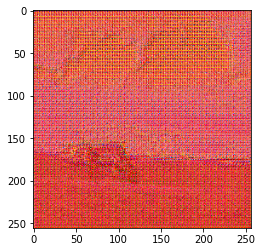

Batch No - 20 Completed with time 6.139651298522949 .Dis Losses =  0.6123191118240356 , 0.3539893627166748 . GAN Losses =  2.2970709800720215 , 0.30681636929512024


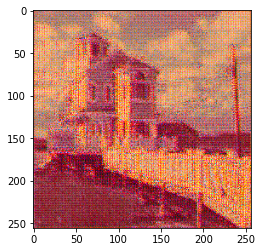

Batch No - 40 Completed with time 4.299346208572388 .Dis Losses =  0.48253700137138367 , 0.17751434445381165 . GAN Losses =  2.907857656478882 , 0.2274976521730423


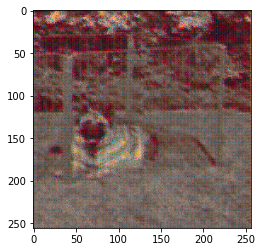

Batch No - 60 Completed with time 4.345499038696289 .Dis Losses =  0.3788408041000366 , 0.08620744198560715 . GAN Losses =  3.6812338829040527 , 0.19382330775260925


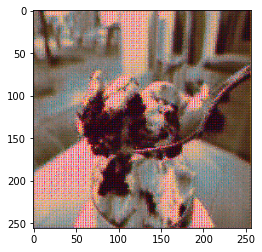

Batch No - 80 Completed with time 4.287106037139893 .Dis Losses =  0.35920849442481995 , 0.08446607738733292 . GAN Losses =  3.473477363586426 , 0.16718202829360962


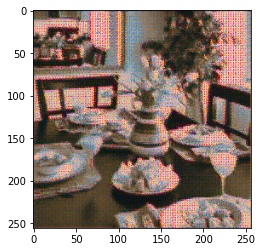

Batch No - 100 Completed with time 4.29103946685791 .Dis Losses =  0.433746874332428 , 0.42517003417015076 . GAN Losses =  4.115424633026123 , 0.1513836830854416


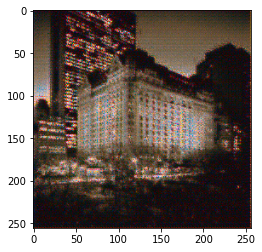

Batch No - 120 Completed with time 4.272240161895752 .Dis Losses =  0.35368186235427856 , 0.037035517394542694 . GAN Losses =  4.123743057250977 , 0.1423124223947525


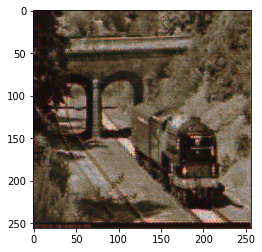

Batch No - 140 Completed with time 4.2935121059417725 .Dis Losses =  0.3834249675273895 , 0.07331975549459457 . GAN Losses =  3.522552251815796 , 0.15611696243286133


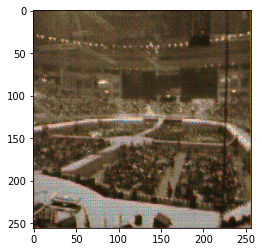

Batch No - 160 Completed with time 4.293701410293579 .Dis Losses =  0.562445878982544 , 0.03458195924758911 . GAN Losses =  3.0553977489471436 , 0.13905149698257446


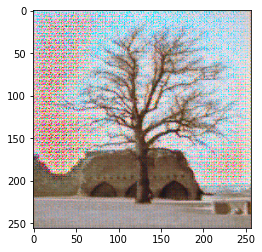

Epoch  1  done
Saving weights as latest_colorize_weights_1


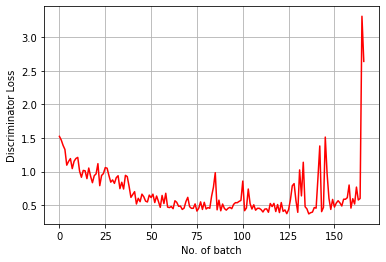

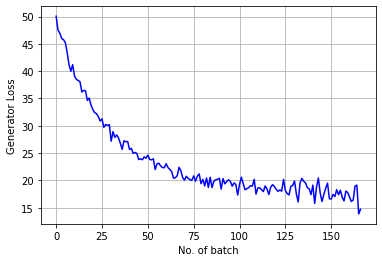

Batch No - 0 Completed with time 6.755634069442749 .Dis Losses =  0.4169498682022095 , 0.10286274552345276 . GAN Losses =  4.4451093673706055 , 0.127788245677948


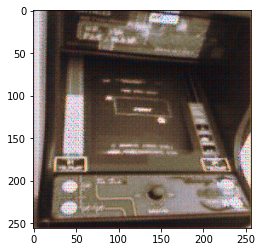

Batch No - 20 Completed with time 4.293602705001831 .Dis Losses =  0.6659762263298035 , 0.20049166679382324 . GAN Losses =  3.000823736190796 , 0.12657351791858673


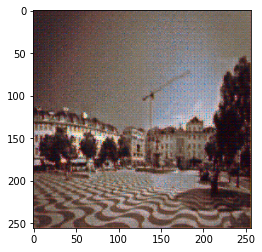

Batch No - 40 Completed with time 4.3019938468933105 .Dis Losses =  1.64212167263031 , 0.006900998298078775 . GAN Losses =  2.2848238945007324 , 0.10311336815357208


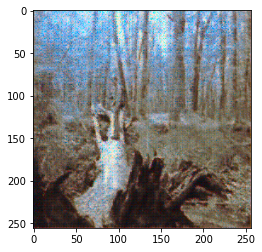

Batch No - 60 Completed with time 4.264930486679077 .Dis Losses =  0.3630863428115845 , 0.2588859796524048 . GAN Losses =  2.9634366035461426 , 0.10173904150724411


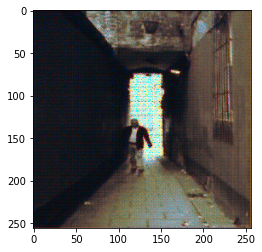

Batch No - 80 Completed with time 4.306394338607788 .Dis Losses =  0.35039222240448 , 0.06175071746110916 . GAN Losses =  4.02080774307251 , 0.09995359927415848


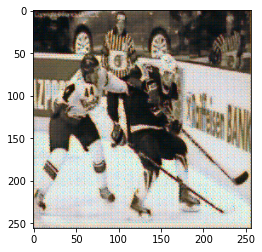

Batch No - 100 Completed with time 4.274415493011475 .Dis Losses =  0.42615047097206116 , 0.12560461461544037 . GAN Losses =  1.9086546897888184 , 0.09681926667690277


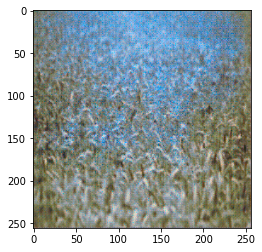

Batch No - 120 Completed with time 4.26128888130188 .Dis Losses =  0.9747608304023743 , 0.028537187725305557 . GAN Losses =  1.9348419904708862 , 0.10255631804466248


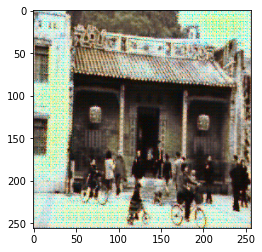

Batch No - 140 Completed with time 4.294435024261475 .Dis Losses =  0.9097375869750977 , 0.06761486083269119 . GAN Losses =  0.6478666067123413 , 0.10352904349565506


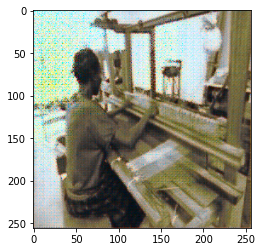

Batch No - 160 Completed with time 4.2714550495147705 .Dis Losses =  0.35290202498435974 , 0.06292593479156494 . GAN Losses =  3.6308116912841797 , 0.10082022845745087


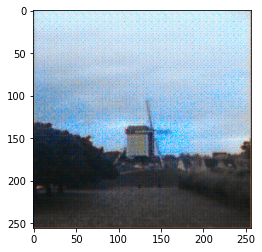

Epoch  2  done
Saving weights as latest_colorize_weights_2


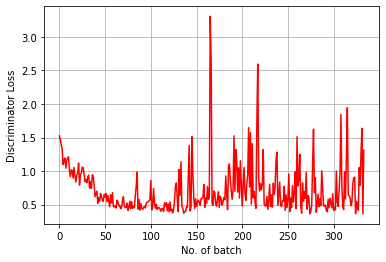

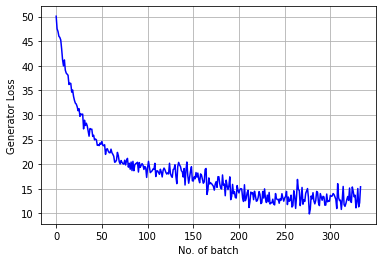

Batch No - 0 Completed with time 6.416051149368286 .Dis Losses =  1.1377978324890137 , 0.07336178421974182 . GAN Losses =  1.7943978309631348 , 0.09887714684009552


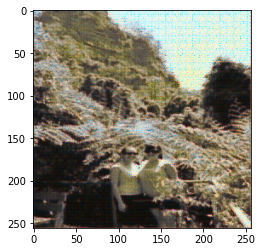

Batch No - 20 Completed with time 4.251537799835205 .Dis Losses =  0.3703807294368744 , 0.09874937683343887 . GAN Losses =  3.60440993309021 , 0.08750512450933456


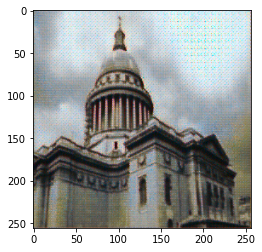

Batch No - 40 Completed with time 4.273481607437134 .Dis Losses =  0.433321088552475 , 0.02936909720301628 . GAN Losses =  4.4999494552612305 , 0.09446072578430176


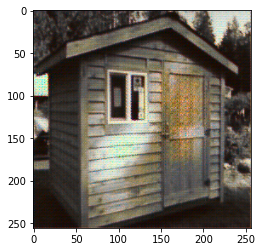

Batch No - 60 Completed with time 4.270649194717407 .Dis Losses =  0.35747745633125305 , 0.16323129832744598 . GAN Losses =  2.9460761547088623 , 0.09905415773391724


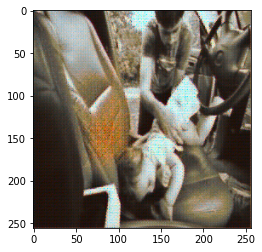

Batch No - 80 Completed with time 4.247720003128052 .Dis Losses =  0.39576151967048645 , 0.6115127205848694 . GAN Losses =  4.223573207855225 , 0.10198469460010529


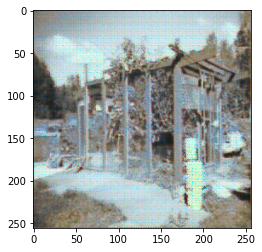

Batch No - 100 Completed with time 4.279351234436035 .Dis Losses =  0.36573588848114014 , 0.038369569927453995 . GAN Losses =  3.6738760471343994 , 0.08549285680055618


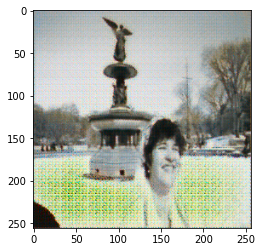

Batch No - 120 Completed with time 4.258123874664307 .Dis Losses =  2.6955974102020264 , 0.006989338435232639 . GAN Losses =  3.6241464614868164 , 0.09773861616849899


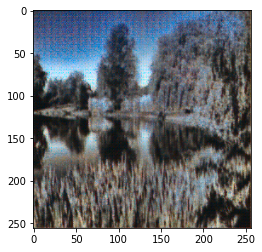

Batch No - 140 Completed with time 4.25806450843811 .Dis Losses =  0.3631782829761505 , 0.07576897740364075 . GAN Losses =  3.239821434020996 , 0.08732259273529053


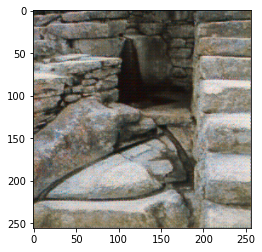

Batch No - 160 Completed with time 4.256630182266235 .Dis Losses =  0.35757961869239807 , 0.3162897527217865 . GAN Losses =  4.327974319458008 , 0.09093368798494339


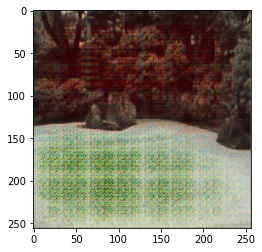

Epoch  3  done
Saving weights as latest_colorize_weights_3


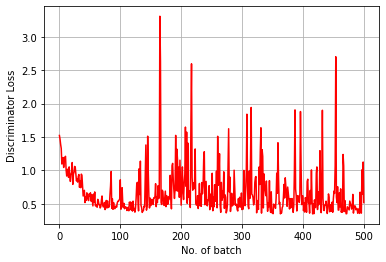

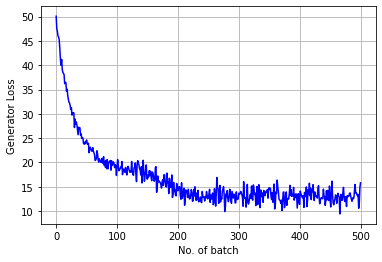

Batch No - 0 Completed with time 6.615878343582153 .Dis Losses =  0.6510568261146545 , 0.0050019752234220505 . GAN Losses =  4.1944499015808105 , 0.09063531458377838


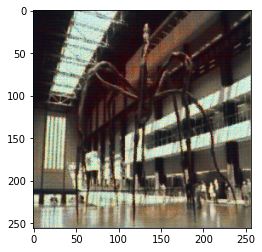

Batch No - 20 Completed with time 4.265228271484375 .Dis Losses =  0.5012288093566895 , 0.051916949450969696 . GAN Losses =  3.166900634765625 , 0.0972718670964241


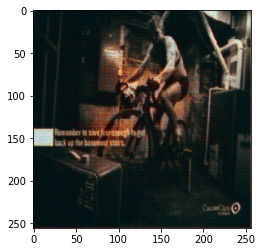

Batch No - 40 Completed with time 4.251106023788452 .Dis Losses =  0.36779406666755676 , 0.0007168567390181124 . GAN Losses =  8.023178100585938 , 0.10131936520338058


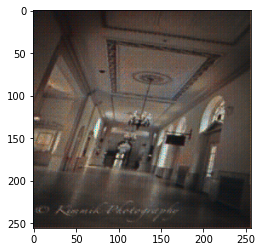

Batch No - 60 Completed with time 4.24853253364563 .Dis Losses =  0.3381477892398834 , 0.0051858508959412575 . GAN Losses =  5.7776384353637695 , 0.08981380611658096


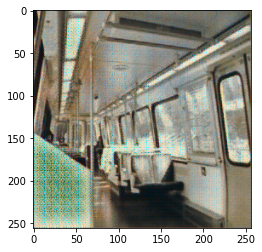

Batch No - 80 Completed with time 4.2569239139556885 .Dis Losses =  0.3500558137893677 , 0.005423718597739935 . GAN Losses =  5.2880072593688965 , 0.09579997509717941


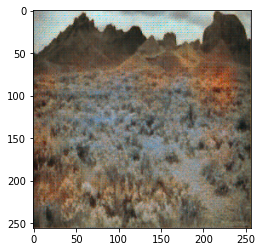

Batch No - 100 Completed with time 4.251513957977295 .Dis Losses =  0.5973420739173889 , 0.001854287344031036 . GAN Losses =  6.090054512023926 , 0.09267505258321762


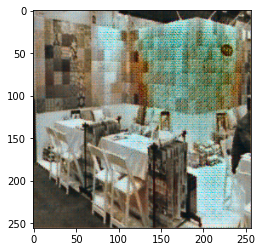

Batch No - 120 Completed with time 4.227017164230347 .Dis Losses =  0.3460937738418579 , 0.05087418109178543 . GAN Losses =  3.7706005573272705 , 0.09465400129556656


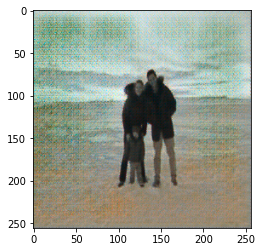

Batch No - 140 Completed with time 4.252246141433716 .Dis Losses =  0.3423346281051636 , 0.0066692945547401905 . GAN Losses =  5.366209983825684 , 0.09462469816207886


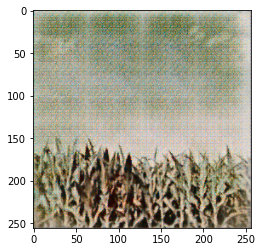

Batch No - 160 Completed with time 4.2209742069244385 .Dis Losses =  0.33974242210388184 , 0.07244358211755753 . GAN Losses =  3.759138345718384 , 0.0980670228600502


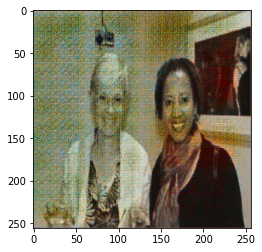

Epoch  4  done
Saving weights as latest_colorize_weights_4


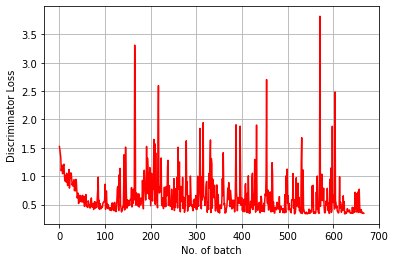

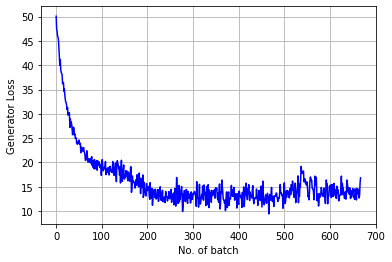

Batch No - 0 Completed with time 6.419823408126831 .Dis Losses =  0.3372410535812378 , 0.0021178030874580145 . GAN Losses =  6.6224541664123535 , 0.0990656316280365


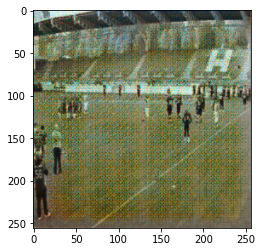

Batch No - 20 Completed with time 4.2615368366241455 .Dis Losses =  0.3618761897087097 , 0.7851698994636536 . GAN Losses =  3.4465391635894775 , 0.09205875545740128


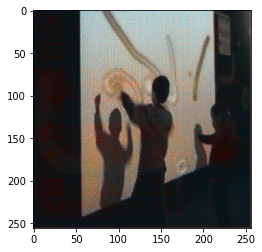

Batch No - 40 Completed with time 4.2387025356292725 .Dis Losses =  0.368537038564682 , 0.1559252142906189 . GAN Losses =  4.0969085693359375 , 0.09903207421302795


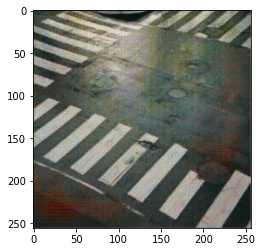

Batch No - 60 Completed with time 4.249097108840942 .Dis Losses =  0.3483065962791443 , 0.0028573793824762106 . GAN Losses =  5.543312072753906 , 0.10420017689466476


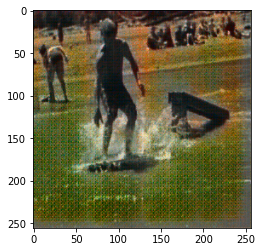

Batch No - 80 Completed with time 4.234661817550659 .Dis Losses =  0.3340182602405548 , 0.0002153168898075819 . GAN Losses =  8.69301700592041 , 0.09700067341327667


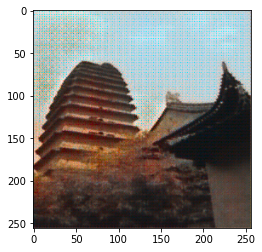

Batch No - 100 Completed with time 4.264450550079346 .Dis Losses =  0.33379143476486206 , 0.05540149658918381 . GAN Losses =  3.9772801399230957 , 0.0955481305718422


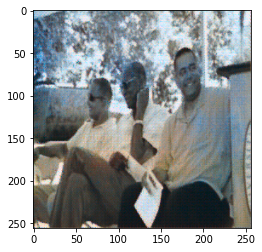

Batch No - 120 Completed with time 4.230285167694092 .Dis Losses =  0.35867488384246826 , 0.001334584318101406 . GAN Losses =  6.53340482711792 , 0.09654857963323593


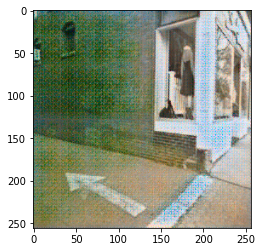

Batch No - 140 Completed with time 4.244350910186768 .Dis Losses =  0.3476100265979767 , 0.0005073719075880945 . GAN Losses =  7.8421406745910645 , 0.09635650366544724


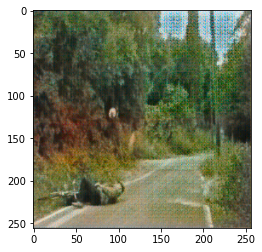

Batch No - 160 Completed with time 4.235729694366455 .Dis Losses =  0.3330781161785126 , 0.010463030077517033 . GAN Losses =  4.979553699493408 , 0.08248180150985718


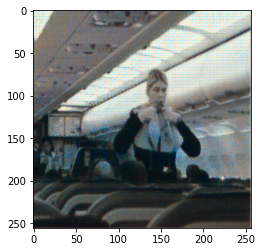

Epoch  5  done
Saving weights as latest_colorize_weights_5


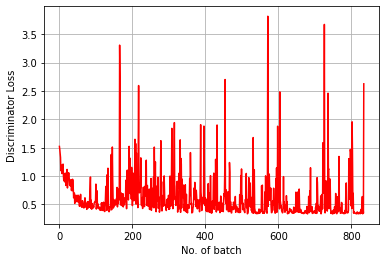

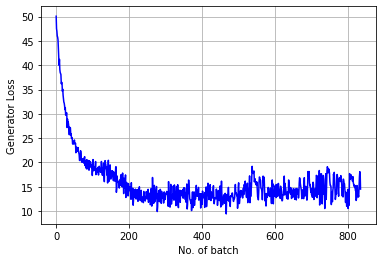

Batch No - 0 Completed with time 6.451435565948486 .Dis Losses =  0.36782005429267883 , 0.002392145339399576 . GAN Losses =  5.088878631591797 , 0.08326560258865356


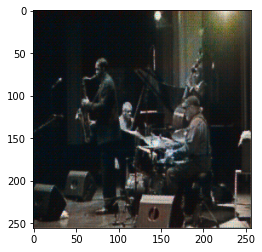

Batch No - 20 Completed with time 4.24418306350708 .Dis Losses =  0.33518272638320923 , 0.0011117097456008196 . GAN Losses =  7.229299068450928 , 0.09693560004234314


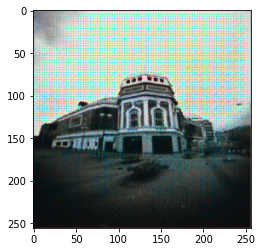

Batch No - 40 Completed with time 4.245193719863892 .Dis Losses =  0.3332315683364868 , 0.006772068329155445 . GAN Losses =  5.410632610321045 , 0.09605111181735992


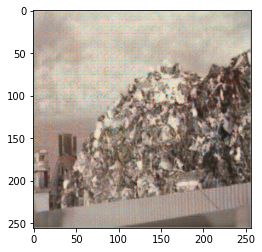

Batch No - 60 Completed with time 4.2175071239471436 .Dis Losses =  0.3395484983921051 , 0.025073379278182983 . GAN Losses =  4.564503192901611 , 0.09534988552331924


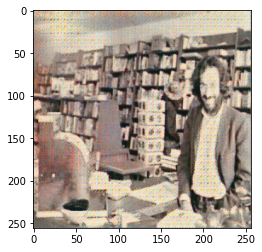

Batch No - 80 Completed with time 4.227761745452881 .Dis Losses =  0.3320278227329254 , 0.0005156905972398818 . GAN Losses =  8.01323413848877 , 0.11201676726341248


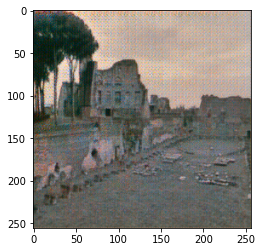

Batch No - 100 Completed with time 4.230159282684326 .Dis Losses =  0.35066962242126465 , 0.00301142199896276 . GAN Losses =  5.961975574493408 , 0.11465489119291306


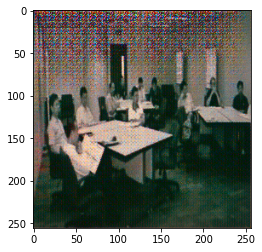

Batch No - 120 Completed with time 4.2266645431518555 .Dis Losses =  0.36082467436790466 , 0.018023576587438583 . GAN Losses =  4.5949296951293945 , 0.10946471989154816


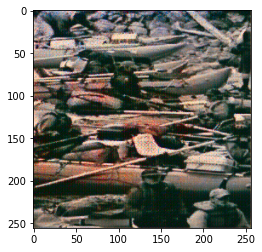

Batch No - 140 Completed with time 4.235989332199097 .Dis Losses =  0.33274105191230774 , 0.023615965619683266 . GAN Losses =  4.403073310852051 , 0.09661588817834854


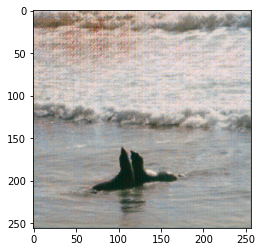

Batch No - 160 Completed with time 4.236275672912598 .Dis Losses =  0.4249618649482727 , 0.0017295386642217636 . GAN Losses =  6.628809928894043 , 0.10662341117858887


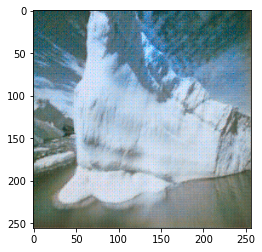

Epoch  6  done
Saving weights as latest_colorize_weights_6


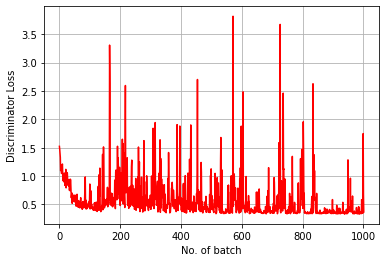

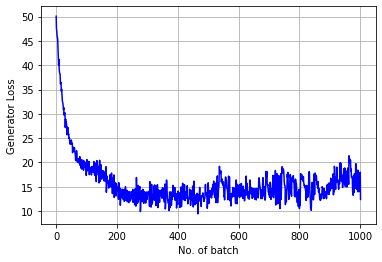

Batch No - 0 Completed with time 7.079594373703003 .Dis Losses =  0.35401955246925354 , 4.398174132802524e-05 . GAN Losses =  10.3800048828125 , 0.11032187193632126


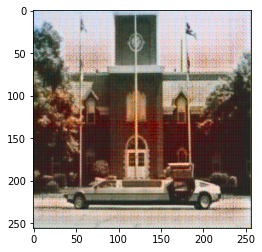

Batch No - 20 Completed with time 4.259995460510254 .Dis Losses =  0.33401885628700256 , 5.934871296631172e-05 . GAN Losses =  10.103998184204102 , 0.10670473426580429


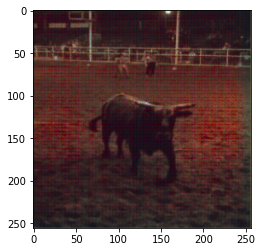

Batch No - 40 Completed with time 4.214191913604736 .Dis Losses =  0.3384461998939514 , 9.775062062544748e-05 . GAN Losses =  9.939318656921387 , 0.10182556509971619


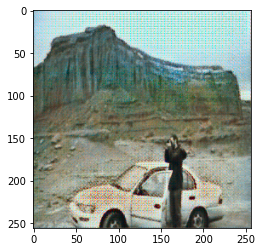

Batch No - 60 Completed with time 4.226271629333496 .Dis Losses =  0.38943058252334595 , 0.0018800258403643966 . GAN Losses =  6.37277364730835 , 0.09223879873752594


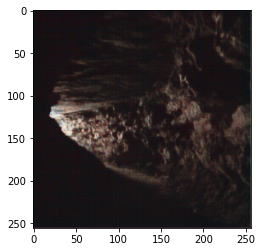

Batch No - 80 Completed with time 4.226041078567505 .Dis Losses =  0.34196779131889343 , 0.00016493893053848296 . GAN Losses =  9.232551574707031 , 0.08077503740787506


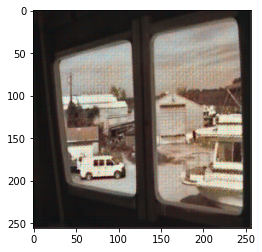

Batch No - 100 Completed with time 4.250437021255493 .Dis Losses =  0.3329300880432129 , 0.0011597891571000218 . GAN Losses =  7.290985584259033 , 0.08556582033634186


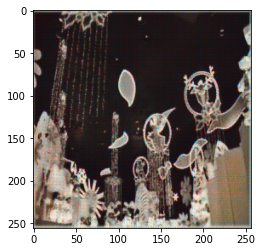

Batch No - 120 Completed with time 4.2310686111450195 .Dis Losses =  0.32943347096443176 , 0.0005825157277286053 . GAN Losses =  8.239351272583008 , 0.07245632261037827


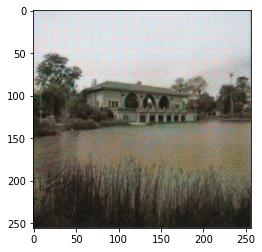

Batch No - 140 Completed with time 4.2490317821502686 .Dis Losses =  0.3334527015686035 , 0.00045335106551647186 . GAN Losses =  8.851078987121582 , 0.08543924242258072


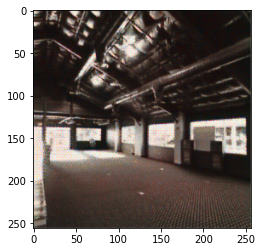

Batch No - 160 Completed with time 4.221109867095947 .Dis Losses =  0.6880358457565308 , 0.9380106329917908 . GAN Losses =  1.2356945276260376 , 0.07362331449985504


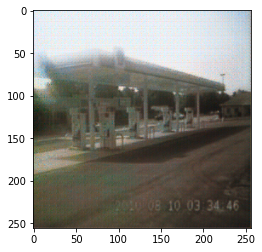

Epoch  7  done
Saving weights as latest_colorize_weights_7


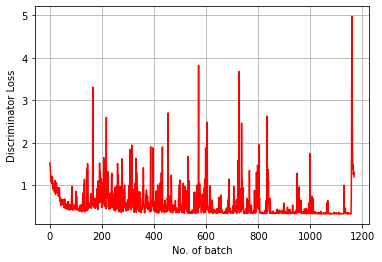

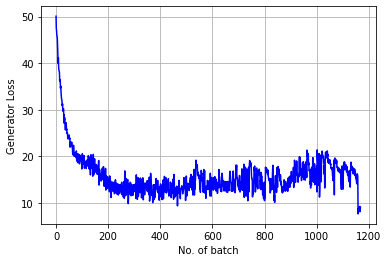

Batch No - 0 Completed with time 6.521077871322632 .Dis Losses =  0.7073561549186707 , 0.5279006361961365 . GAN Losses =  0.9403152465820312 , 0.07697667181491852


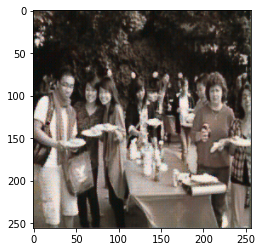

Batch No - 20 Completed with time 4.25089955329895 .Dis Losses =  0.6538152694702148 , 0.4545932412147522 . GAN Losses =  1.264552116394043 , 0.067385733127594


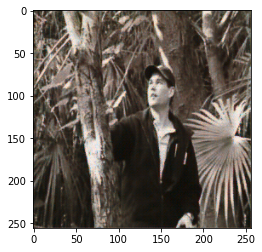

Batch No - 40 Completed with time 4.236012935638428 .Dis Losses =  0.5412337779998779 , 0.39899662137031555 . GAN Losses =  1.4709781408309937 , 0.07543093711137772


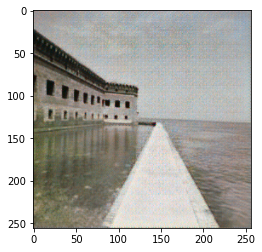

Batch No - 60 Completed with time 4.246840476989746 .Dis Losses =  0.4215352535247803 , 1.0704519748687744 . GAN Losses =  1.5450478792190552 , 0.07118356972932816


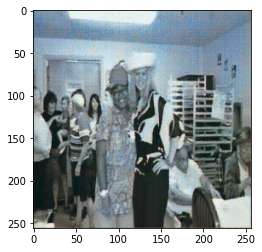

Batch No - 80 Completed with time 4.261392831802368 .Dis Losses =  0.4925577938556671 , 0.5096598267555237 . GAN Losses =  1.9126049280166626 , 0.08020879328250885


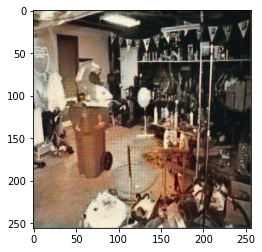

Batch No - 100 Completed with time 4.258644104003906 .Dis Losses =  1.2285884618759155 , 0.14768429100513458 . GAN Losses =  1.195064902305603 , 0.07827957719564438


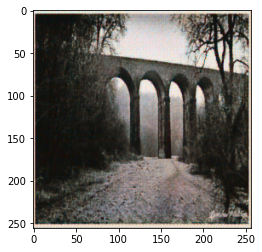

Batch No - 120 Completed with time 4.229660749435425 .Dis Losses =  0.5137574672698975 , 0.4903026223182678 . GAN Losses =  2.1838884353637695 , 0.07368206977844238


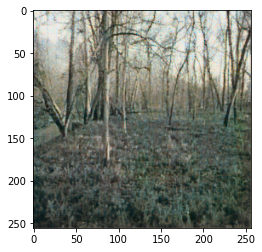

Batch No - 140 Completed with time 4.234840631484985 .Dis Losses =  0.435794472694397 , 0.380214661359787 . GAN Losses =  1.9035924673080444 , 0.08064141124486923


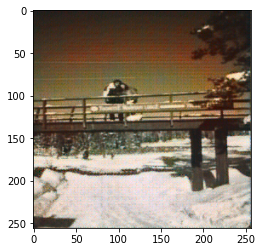

Batch No - 160 Completed with time 4.234230279922485 .Dis Losses =  1.1163443326950073 , 0.2937990725040436 . GAN Losses =  1.1162559986114502 , 0.0743558332324028


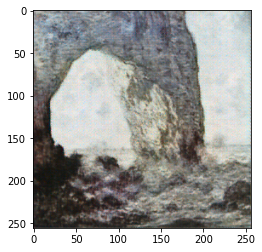

Epoch  8  done
Saving weights as latest_colorize_weights_8


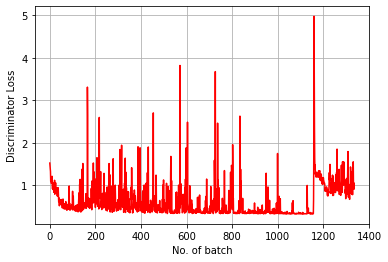

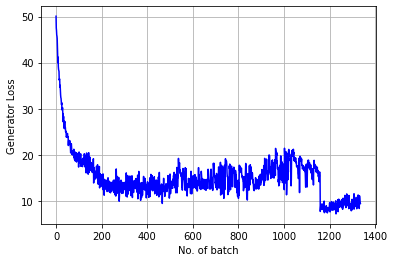

Batch No - 0 Completed with time 6.482962131500244 .Dis Losses =  0.48134171962738037 , 0.26881182193756104 . GAN Losses =  2.3627753257751465 , 0.08148354291915894


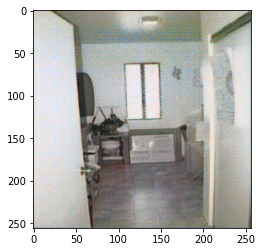

Batch No - 20 Completed with time 4.254350662231445 .Dis Losses =  1.0856024026870728 , 0.16902974247932434 . GAN Losses =  1.893862247467041 , 0.07983800768852234


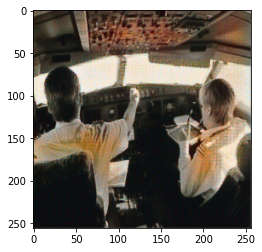

Batch No - 40 Completed with time 4.236083507537842 .Dis Losses =  0.5906168818473816 , 0.5747486352920532 . GAN Losses =  1.9932315349578857 , 0.08584895730018616


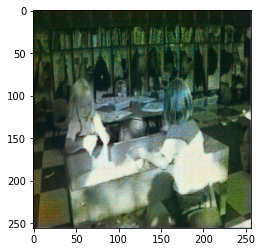

Batch No - 60 Completed with time 4.253181457519531 .Dis Losses =  1.4825235605239868 , 0.08610023558139801 . GAN Losses =  1.7947945594787598 , 0.08229024708271027


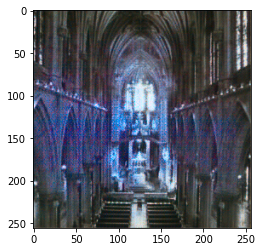

Batch No - 80 Completed with time 4.251935720443726 .Dis Losses =  0.3925568163394928 , 0.376865416765213 . GAN Losses =  1.726394534111023 , 0.08632168173789978


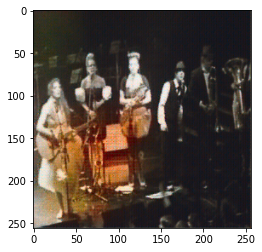

Batch No - 100 Completed with time 4.247452735900879 .Dis Losses =  0.35990196466445923 , 0.34804844856262207 . GAN Losses =  2.473904609680176 , 0.0821753442287445


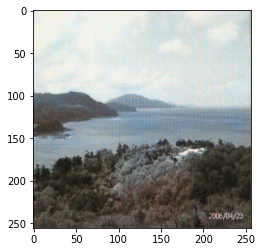

Batch No - 120 Completed with time 4.258440256118774 .Dis Losses =  0.5712973475456238 , 0.3059402108192444 . GAN Losses =  2.1800308227539062 , 0.08438877761363983


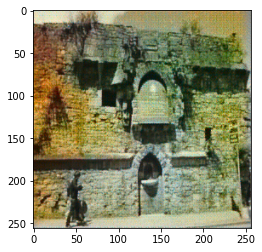

Batch No - 140 Completed with time 4.2593584060668945 .Dis Losses =  0.4943428933620453 , 0.38618332147598267 . GAN Losses =  2.551621198654175 , 0.08905664086341858


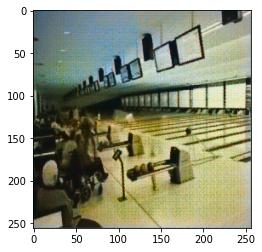

Batch No - 160 Completed with time 4.247334241867065 .Dis Losses =  1.1764076948165894 , 0.2578120827674866 . GAN Losses =  1.2942484617233276 , 0.07831066846847534


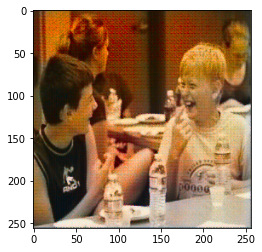

Epoch  9  done
Saving weights as latest_colorize_weights_9


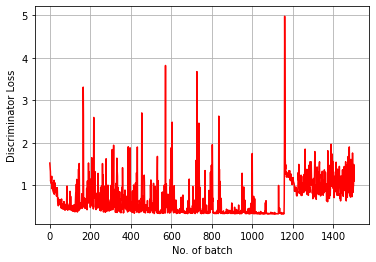

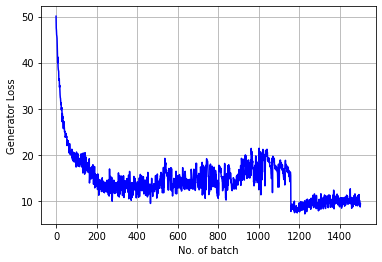

In [ ]:
torch.autograd.set_detect_anomaly(True)
step=1
if config.resume:
  step=checkpoint['step']+1
training=True
D_BCE=nn.BCELoss()
G_BCE=nn.BCELoss()
L1=nn.L1Loss()
real_label=0.9
fake_label=0.0
time_last=time.time()

while step<config.epoch:
  for i,(lab_imgs,gray_imgs,imgs) in enumerate(train_loader):

      lab_imgs=Variable(lab_imgs.cuda().type(dtype))
      gray_imgs=Variable(gray_imgs.cuda().type(dtype))
      imgs=Variable(imgs.cuda().type(dtype))
      
      #### Update D Network ####
      Dis_Model.zero_grad()
      output=Dis_Model(lab_imgs)
      output=torch.squeeze(output,1)
      error_D_real=D_BCE(output,((real_label) * torch.ones(output.size(0))).cuda())

      fake_img=Gen_Model(gray_imgs).detach()
      output=Dis_Model(fake_img)
      output=torch.squeeze(output,1)
      error_D_fake=D_BCE(output,(torch.zeros(output.size(0))).cuda())

      error_D = error_D_real + error_D_fake
      loss_d.append(error_D.detach().cpu())
      error_D.backward()

      optimizer_D.step()

      #### Update G Network ####

      Gen_Model.zero_grad()
      fake_img=Gen_Model(gray_imgs)
      output=Dis_Model(fake_img)
      output=torch.squeeze(output,1)
      error_G_GAN=G_BCE(output,(torch.ones(output.size(0))).cuda())
      error_G_L1=L1(fake_img.view(fake_img.size(0),-1),lab_imgs.view(lab_imgs.size(0),-1))

      error_G = error_G_GAN + config.lamb * error_G_L1

      error_G.backward()
      optimizer_G.step()
      loss_g.append(error_G.detach().cpu())
      ##########
      this_time=time.time()
      if i%20==0:
        print("Batch No -",i,"Completed with time",this_time-time_last,".Dis Losses = ",error_D_real.item(),",",error_D_fake.item(),". GAN Losses = ",error_G_GAN.item(),",",error_G_L1.item())
        with torch.no_grad():
          imfakeshow(fake_img[0])
      time_last=time.time()

  print("Epoch ",step," done")
  state={'step':step,
         'state_dict_G':Gen_Model.state_dict(),
         'state_dict_D':Dis_Model.state_dict(),
         'optimizer_G':optimizer_G.state_dict(),
         'optimizer_D':optimizer_D.state_dict()}
  save_weights(state,step)
  save_loss_hist(loss_d,loss_g)
  plt.plot(np.array(loss_d), 'r')
  plt.xlabel('No. of batch')
  plt.ylabel('Discriminator Loss')
  plt.grid()
  plt.show()
  plt.plot(np.array(loss_g), 'b')
  plt.xlabel('No. of batch')
  plt.ylabel('Generator Loss')
  plt.grid()
  plt.show()
  step+=1

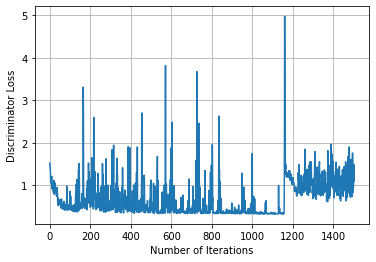

In [ ]:
plt.plot(np.array(loss_d))
plt.ylabel("Discriminator Loss")
plt.xlabel("Number of Iterations")
plt.grid()

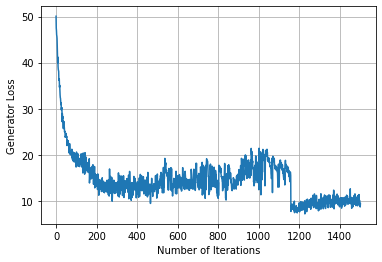

In [ ]:
plt.plot(np.array(loss_g))
plt.ylabel("Generator Loss")
plt.xlabel("Number of Iterations")
plt.grid()

Test your Model

In [ ]:
################# Test Time ######################
#test_size = 1000;
model=Generator().to(device)
model.eval()
checkpoint=torch.load(config.save_path)
model.load_state_dict(checkpoint['state_dict_G'])

generated_imgs = []
real_imgs = []
bw_imgs = []
Lab_imgs = []

with torch.no_grad():
    test_data=Places365Loader('test')
    test_loader=DataLoader(test_data,config.batch_size,shuffle=False,collate_fn=test_collate)
    for i,(lab_imgs,gray_imgs,imgs) in enumerate(test_loader):
      lab_imgs=lab_imgs.cuda().type(dtype)
      gray_imgs=gray_imgs.cuda().type(dtype)
      imgs=imgs.cuda().type(dtype)
      fake_img=Gen_Model(gray_imgs)

      fake_img = fake_img.detach().cpu()
      lab_imgs = lab_imgs.detach().cpu()
      gray_imgs = gray_imgs.detach().cpu()
      imgs = imgs.detach().cpu()

      generated_imgs.append(fake_img)
      real_imgs.append(imgs)
      bw_imgs.append(gray_imgs)
      Lab_imgs.append(lab_imgs)


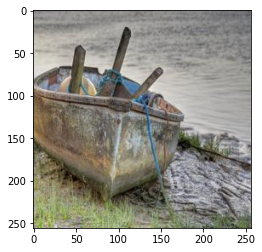

In [ ]:
imlabshow(lab_imgs[5])

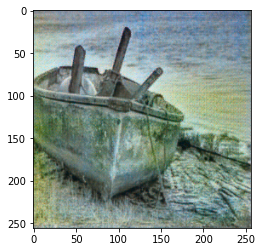

In [ ]:
imfakeshow(fake_img[5])

In [ ]:
lis_generated_imgs = []
lis_real_imgs = []
lis_bw_imgs = []
lis_lab_imgs = []
for i in range(len(generated_imgs)):
  for j in range(generated_imgs[i].shape[0]):
    lis_generated_imgs.append(np.array(generated_imgs[i])[j])
    lis_real_imgs.append(np.array(real_imgs[i])[j])
    lis_bw_imgs.append(np.array(bw_imgs[i])[j])
    lis_lab_imgs.append(np.array(Lab_imgs[i])[j])

In [ ]:
from math import log10, sqrt
from sklearn.metrics import mean_absolute_error
def eval_metric(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    mae = mean_absolute_error(original.reshape((256*3,256)),compressed.reshape((256*3,256)))
    return psnr,mae

In [ ]:
lis_generated_imgs[0].shape

(3, 256, 256)

In [ ]:
PSNR_metric_vanilla_dcgan = []
MAE_metric_vanilla_dcgan = []
for i in range(len(lis_generated_imgs)):
  original = lis_real_imgs[i]
  generated = lis_generated_imgs[i]
  psnr,mae = eval_metric(original,generated)
  PSNR_metric_vanilla_dcgan.append(psnr)
  MAE_metric_vanilla_dcgan.append(mae) 

In [ ]:
print('PSNR metric is', sum(PSNR_metric_vanilla_dcgan)/len(PSNR_metric_vanilla_dcgan))
print('MAE metric is', sum(MAE_metric_vanilla_dcgan)/len(MAE_metric_vanilla_dcgan))

PSNR metric is 6.253443608036637
MAE metric is 113.33898872375488


In [ ]:
def show_results(i,lis_generated_imgs,lis_lab_imgs,lis_bw_imgs):
  print("GrayScale Image - ")
  imgrayshow(torch.tensor(lis_bw_imgs[i]))
  print("Original Image - ")
  imlabshow(torch.tensor(lis_lab_imgs[i]))
  print("Model Output Image - ")
  imfakeshow(torch.tensor(lis_generated_imgs[i]))

GrayScale Image - 


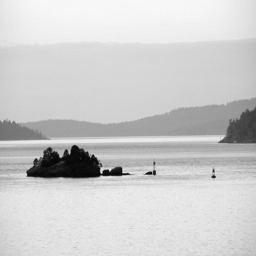

Original Image - 


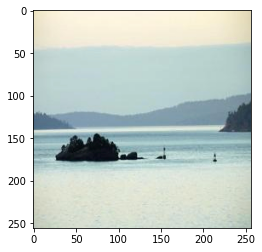

Model Output Image - 


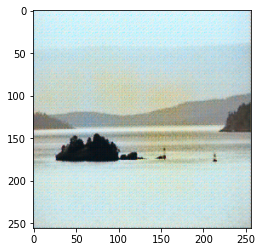

In [63]:
show_results(41,lis_generated_imgs,lis_lab_imgs,lis_bw_imgs)